# This colab notebook runs the face and the age-gender models.

Since colab does not support docker, we have to run them one by one.

There are two repos used here. One is the [face-detection-recognition](https://github.com/tae898/face-detection-recognition.git) and the other is [age-gender](https://github.com/tae898/age-gender.git).

If you encounter a problem, run `Runtime` -> `Factory reset runtime` and run the cells from the beginning.



## Clone the two repos, and install them.

In [ ]:
%%bash
git clone https://github.com/tae898/face-detection-recognition.git
cd face-detection-recognition
wget https://github.com/tae898/face-detection-recognition/releases/download/models/models.zip

unzip models.zip

mkdir -p ~/.insightface/
mv models ~/.insightface/

pip install -r requirements.txt
cd python-package && pip install . && cd ..

cd ..
git clone https://github.com/tae898/age-gender.git
cd age-gender
#pip3 install -r requirements.txt

# remove the annotated images and pickle files cuz we want to get them manually later.
rm test-images/*ANNOTATED*
rm test-images/*.pkl
rm test-images/*

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%%bash
cp -a /content/gdrive/MyDrive/images-gender-classification/. /content/age-gender/test-images/

## Pip Install Libraries

In [ ]:
pip install Flask==2.0.1

In [ ]:
pip install jsonpickle==2.0.0

In [ ]:
pip install Pillow==8.3.1

In [ ]:
pip install scipy

In [ ]:
pip install torch

In [ ]:
pip install tqdm==4.61.2

## Run the two flask API services.

In [ ]:
%cd face-detection-recognition/
import subprocess

subprocess.Popen(["python3", "app.py", "--gpu-id", "-1"])

%cd  ../age-gender
subprocess.Popen(["python3", "app.py"])

import time

time.sleep(10)

/content/face-detection-recognition
/content/age-gender


## Run inference on the test images

In [ ]:
%%bash
ls test-images/* | wc -l

7


In [ ]:
%%bash
lscpu

Architecture:                    x86_64
CPU op-mode(s):                  32-bit, 64-bit
Address sizes:                   48 bits physical, 48 bits virtual
Byte Order:                      Little Endian
CPU(s):                          2
On-line CPU(s) list:             0,1
Vendor ID:                       AuthenticAMD
Model name:                      AMD EPYC 7B12
CPU family:                      23
Model:                           49
Thread(s) per core:              2
Core(s) per socket:              1
Socket(s):                       1
Stepping:                        0
BogoMIPS:                        4499.99
Flags:                           fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ht syscall nx mmxext fxsr_opt pdpe1gb rdtscp lm constant_tsc rep_good nopl nonstop_tsc cpuid extd_apicid tsc_known_freq pni pclmulqdq ssse3 fma cx16 sse4_1 sse4_2 movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm cmp_legacy cr8_legacy abm ss

In [ ]:
%%time
%%bash
for filename in test-images/*; do
    python client.py --image-path $filename
done

2023-08-25 16:17:07.334 INFO client - <module>: arguments given to /content/age-gender/client.py: {'url_face': 'http://127.0.0.1:10002/', 'url_age_gender': 'http://127.0.0.1:10003/', 'image_path': 'test-images/2E045201-5898-416B-BCBD-10340A453AF0.jpeg', 'camera_id': 0, 'mode': 'image'}
2023-08-25 16:17:07.334 DEBUG client - run_image: loading image ...
2023-08-25 16:17:07.335 INFO client - send_to_servers: image loaded!
2023-08-25 16:17:07.335 DEBUG client - send_to_servers: sending image to server...
2023-08-25 16:17:07.338 DEBUG connectionpool - _new_conn: Starting new HTTP connection (1): 127.0.0.1:10002
2023-08-25 16:17:10.531 DEBUG connectionpool - _make_request: http://127.0.0.1:10002 "POST / HTTP/1.1" 200 7798
2023-08-25 16:17:10.532 INFO client - send_to_servers: got <Response [200]> from server!...
2023-08-25 16:17:10.532 INFO client - send_to_servers: 2 faces deteced!
2023-08-25 16:17:10.533 DEBUG client - send_to_servers: sending embeddings to server ...
2023-08-25 16:17:10.

CPU times: user 81.1 ms, sys: 9.29 ms, total: 90.4 ms
Wall time: 17.8 s


## Check if the results are saved properly

In [ ]:
!ls test-images/

2E045201-5898-416B-BCBD-10340A453AF0.jpeg
2E045201-5898-416B-BCBD-10340A453AF0.jpeg.ANNOTATED.jpg
2E045201-5898-416B-BCBD-10340A453AF0.jpeg.ANNOTATED.jpg.pkl
2FF7D0EA-81FE-47E6-ABFF-DBE5629DF32F.jpg
2FF7D0EA-81FE-47E6-ABFF-DBE5629DF32F.jpg.ANNOTATED.jpg
2FF7D0EA-81FE-47E6-ABFF-DBE5629DF32F.jpg.ANNOTATED.jpg.pkl
ins_101.png
ins_101.png.ANNOTATED.jpg
ins_101.png.ANNOTATED.jpg.pkl
ins_102.png
ins_102.png.ANNOTATED.jpg
ins_102.png.ANNOTATED.jpg.pkl
ins_103.png
ins_103.png.ANNOTATED.jpg
ins_103.png.ANNOTATED.jpg.pkl
ins_104.png
ins_104.png.ANNOTATED.jpg
ins_104.png.ANNOTATED.jpg.pkl
ins_105.png
ins_105.png.ANNOTATED.jpg
ins_105.png.ANNOTATED.jpg.pkl


## Let's visualize the annotaed images!

##**CAUTION: Before you run the below cells, you have to run `Runtime` -> `Restart runtime`**

[Errno 2] No such file or directory: 'age-gender'
/content/age-gender


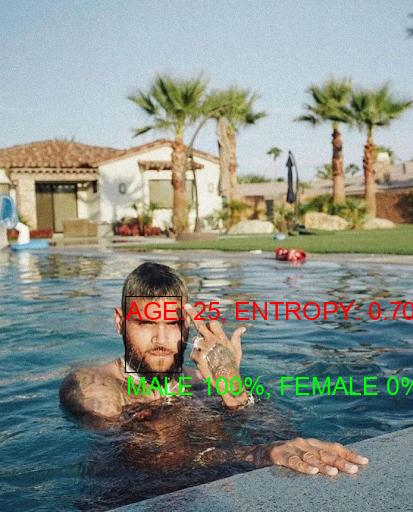

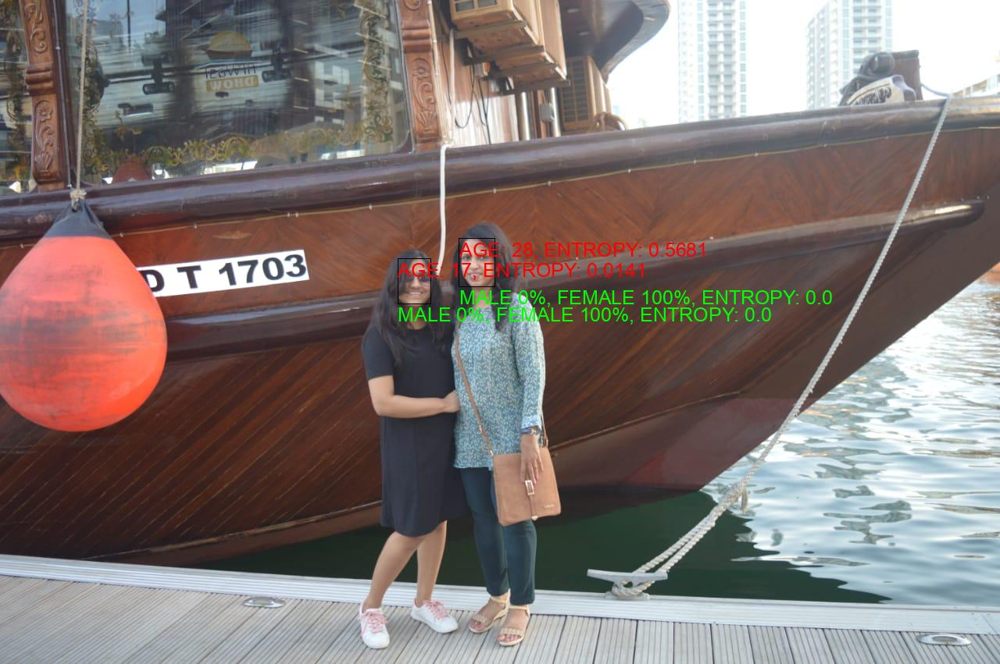

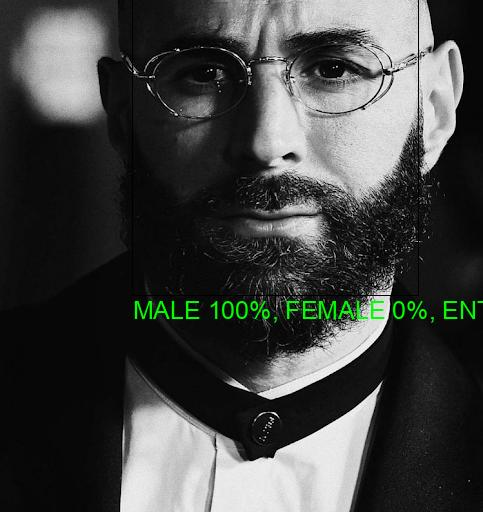

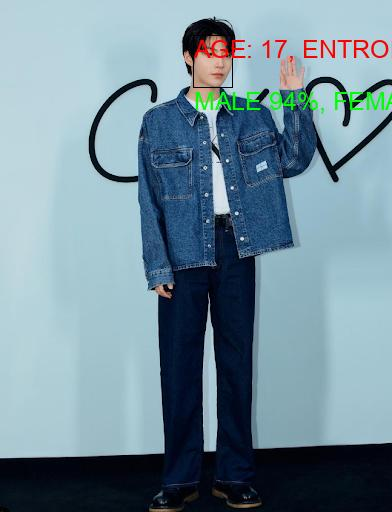

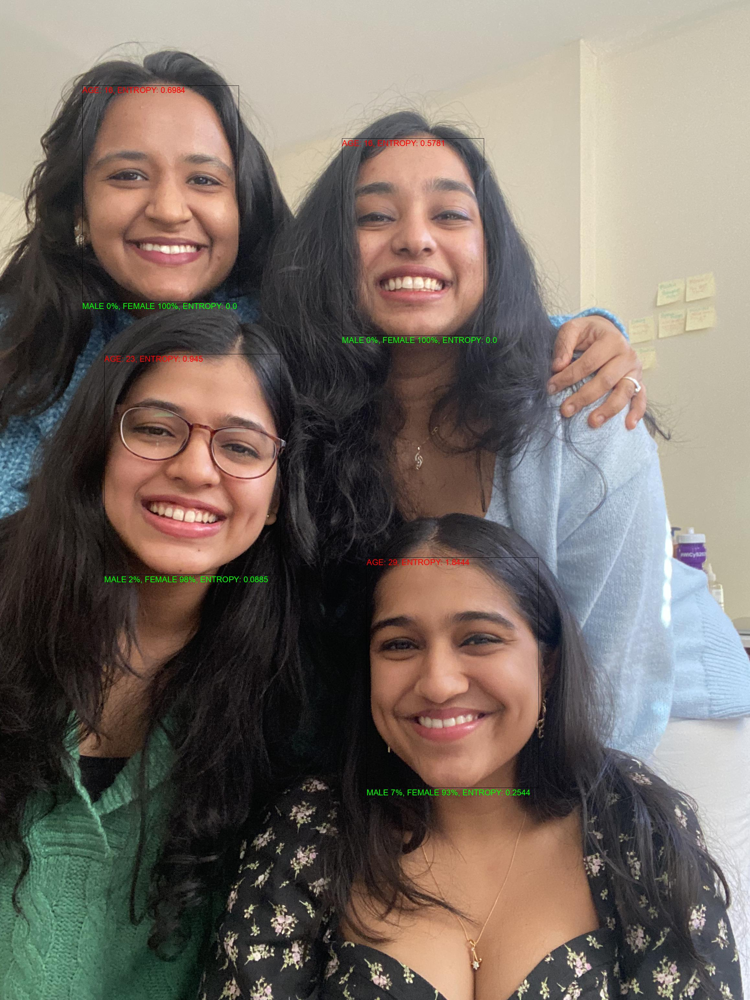

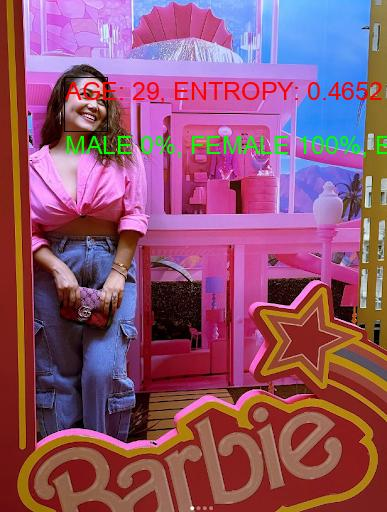

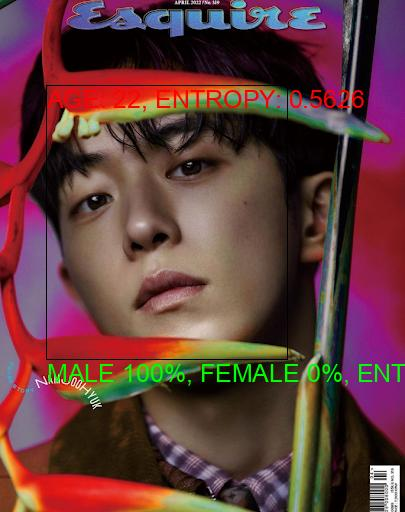

In [ ]:
%cd age-gender
from PIL import Image
from glob import glob

for image_path in glob("./test-images/*ANNOTATED.jpg"):
    image = Image.open(image_path)
    display(image)

## The bounding boxes, detection scores, landmarks, face-embeddings, genders, and ages are saved as pickle.

In [ ]:
import pickle

for pickle_path in glob("./test-images/*.pkl"):
    with open(pickle_path, "rb") as stream:
        results = pickle.load(stream)
        print(pickle_path, [(key, len(val)) for key, val in results.items()])

./test-images/ins_368.png.ANNOTATED.jpg.pkl [('bboxes', 1), ('det_scores', 1), ('landmarks', 1), ('embeddings', 1), ('genders', 1), ('ages', 1)]
./test-images/ins_366.png.ANNOTATED.jpg.pkl [('bboxes', 2), ('det_scores', 2), ('landmarks', 2), ('embeddings', 2), ('genders', 2), ('ages', 2)]
./test-images/ins_369.png.ANNOTATED.jpg.pkl [('bboxes', 1), ('det_scores', 1), ('landmarks', 1), ('embeddings', 1), ('genders', 1), ('ages', 1)]
./test-images/ins_365.png.ANNOTATED.jpg.pkl [('bboxes', 1), ('det_scores', 1), ('landmarks', 1), ('embeddings', 1), ('genders', 1), ('ages', 1)]
